In [ ]:
import pandas as pd
import numpy as np
import umap
import umap.plot
import json
from umap_subset import fit_umap_on_clusters, plot_selected_clusters, plot_clusters_with_custom_colors
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [4]:
raw_df = pd.read_csv('first_query_clustered.csv')
embedding_path =  'wildchat_embeddings.jsonl' ## create your embedding file refer to README.md 
embeddings = []
with open(embedding_path, 'r') as f:
    for line in f:
        embeddings.append(json.loads(line))

embeddings = np.array(embeddings)

# # remove duplicates --- note that the wildchat dataset has duplicated inputs
# conversation_hash_to_index = {}
# unique_embeddings = []

# for i, item in enumerate(embeddings):
#     conv_hash = item['conversation_hash']
#     if conv_hash not in conversation_hash_to_index:
#         conversation_hash_to_index[conv_hash] = len(unique_embeddings)
#         unique_embeddings.append(item)

# # Replace the original embeddings with the deduplicated list
# embeddings = unique_embeddings
# print(f"Number of embeddings after removing duplicates: {len(embeddings)}")

In [ ]:
full_umap = fit_umap_on_clusters(raw_df, embeddings, cluster_col='cluster', clusters=None, n_neighbors=30, min_dist=0.8, n_components=3, metric='cosine', random_state=42)

FULL UMAP

In [6]:
from umap_subset import get_distinct_colors

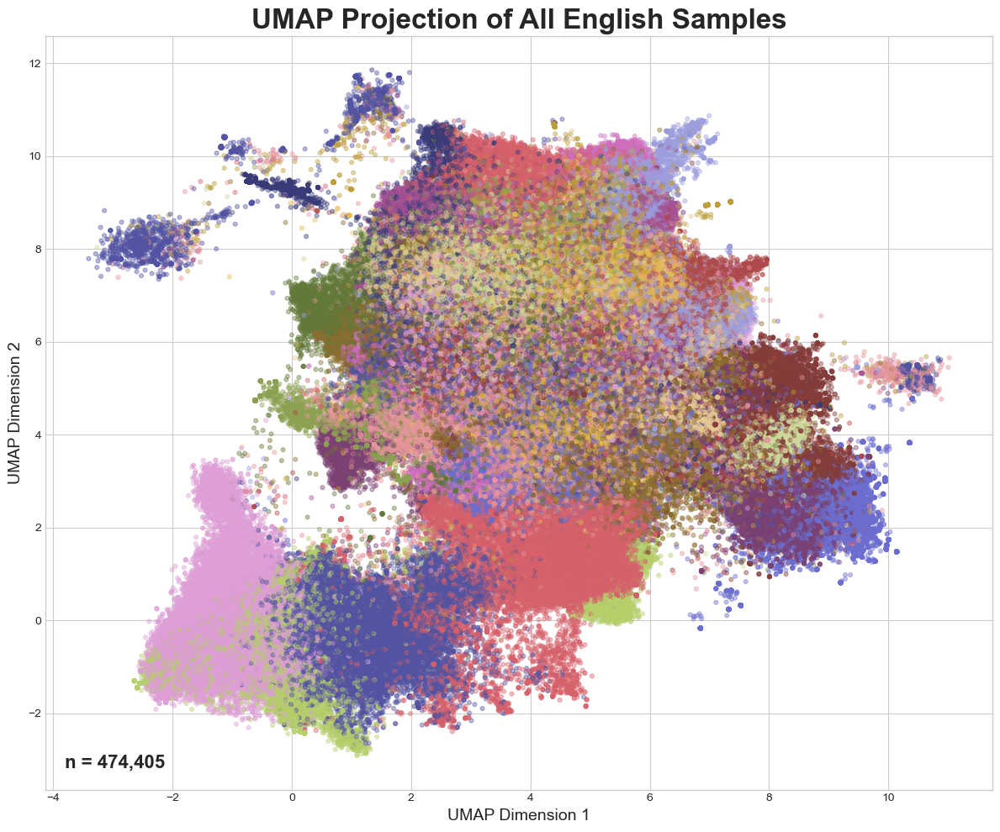

In [7]:
# Set the style
plt.style.use('seaborn-v0_8-whitegrid')

colors = get_distinct_colors(60)
lut = {cid: colors[cid % 60] for cid in range(60)}

# Create a visualization colored by the existing cluster column
plt.figure(figsize=(12, 10))
scatter = plt.scatter(
    full_umap['umap_x'],
    full_umap['umap_y'],
    c=full_umap['cluster'], #.astype('category').cat.codes,  # Convert to numeric codes
    cmap= 'tab20b',  # Colormap with distinct colors
    alpha=0.4,
    s=12
)

plt.title('UMAP Projection of All English Samples', fontsize=24, fontweight='bold')
plt.xlabel('UMAP Dimension 1', fontsize=14)
plt.ylabel('UMAP Dimension 2', fontsize=14)

# Get the current axis
ax = plt.gca()

# Add text at the bottom left
ax.text(0.02, 0.025,
        f'n = 474,405',
        transform=ax.transAxes,
        ha='left', va='bottom',
        fontsize=16, weight='bold',
        bbox=dict(fc='white', ec='none', alpha=0.7, pad=0.3))

# # Add grid for better readability
# plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('UMAP_Global.png', dpi=300, bbox_inches='tight')
plt.show()

In [25]:
image_gen_clusters = [3, 18, 42, 57]
orchestration_clusters = [17, 56]
jail_breaking_clusters = [9, 43]
short_greeting_clusters = [4]

peripheral_clusters = image_gen_clusters + orchestration_clusters + jail_breaking_clusters + short_greeting_clusters

non_peripheral_clusters = [i for i in range(60) if i not in peripheral_clusters]

clear_performative = [0, 11, 16, 23, 27, 30, 34, 35, 40, 41, 52]

clear_expressive = [1, 6,7,8,10,12,14,19,22,24,25,32,36,38,39,48,49,50,54, 59]

scaled_creative_workhorse_clusters = [7, 12, 48, 38, 39, 59, 54, 50]

business_workplace_clusters = [2,5,15,21, 31,33,44,45,51]

pure_technical_coding_clusters = [0,11,23,30,34,40,52]

history_clusters = [14, 55, 58]

music_poetry_clusters = [28, 29]

codeswitching_clusters = [13, 37]


SAMPLE clusters

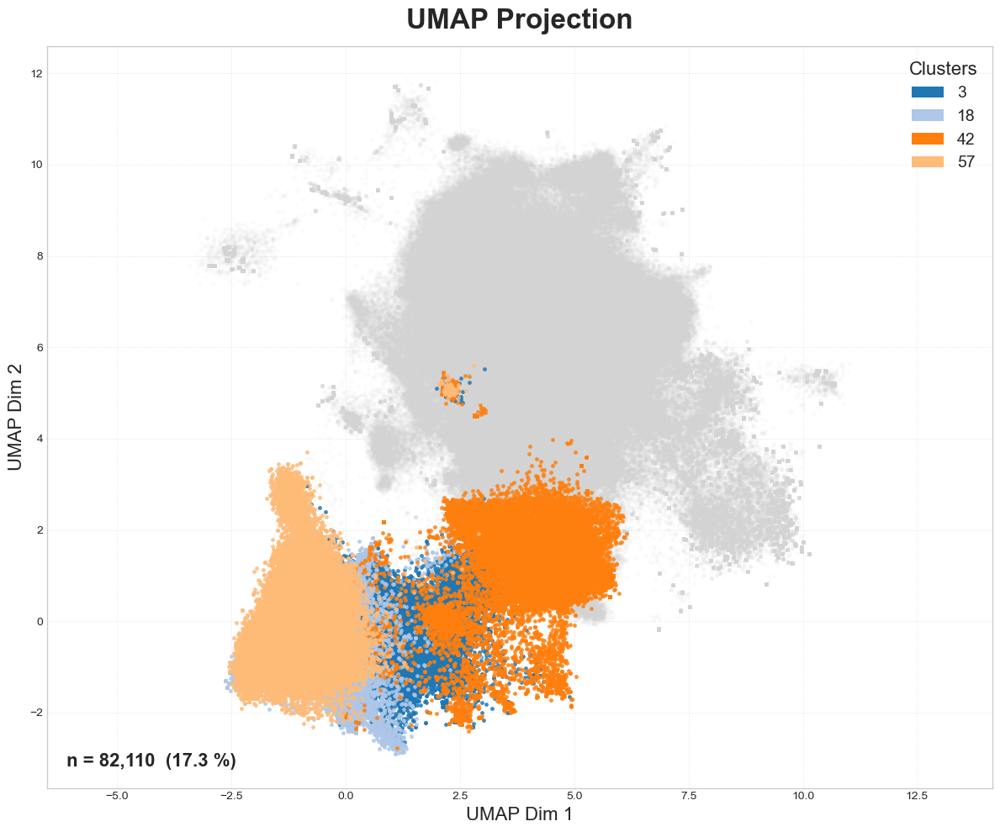

In [9]:
plot_selected_clusters(full_umap, 
                       annotate=False, 
                       figsize=(12, 10), 
                       highlight_ids= image_gen_clusters, 
                       title='UMAP Projection', 
                       legend_title='Clusters')

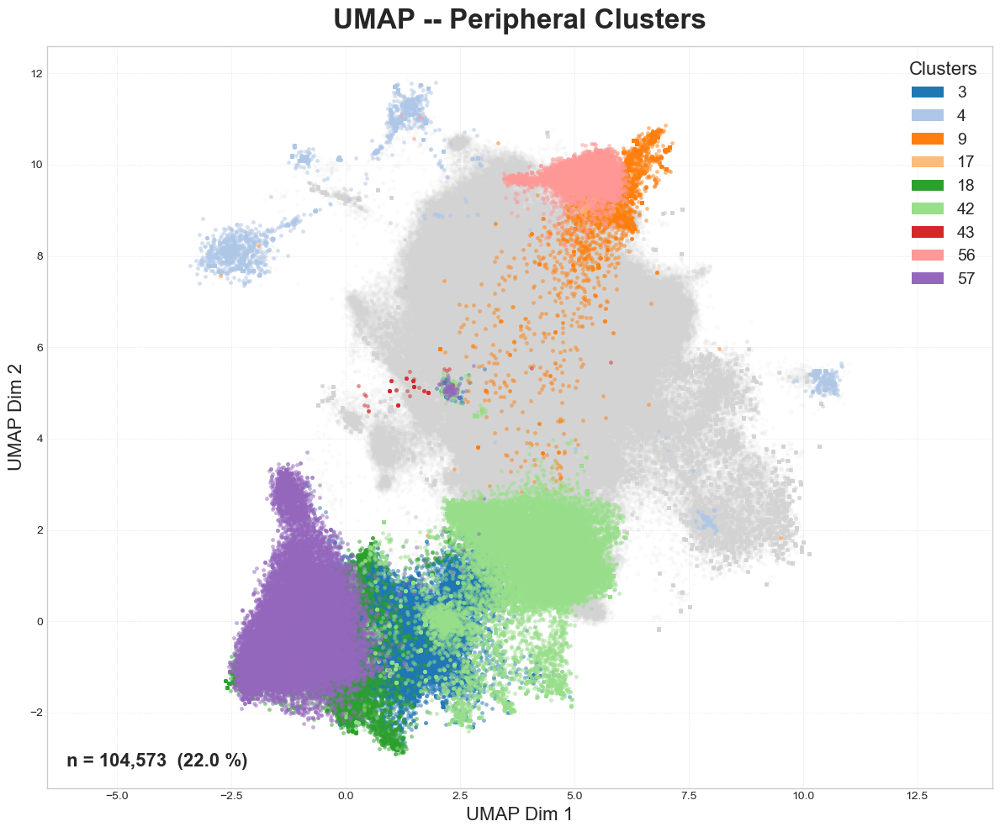

In [10]:
plot_selected_clusters(full_umap, 
                       annotate=False, 
                       figsize=(12, 10),
                       alpha_fg= 0.5,
                       alpha_bg= 0.08,
                       highlight_ids= peripheral_clusters, 
                       title='UMAP -- Peripheral Clusters',
                       save_as= "UMAP_Peripheral",
                       legend_title='Clusters')

Globally Periphral Clusters

In [ ]:
non_peripheral_umap = fit_umap_on_clusters(raw_df, embeddings, cluster_col='cluster', clusters=non_peripheral_clusters, n_neighbors=30, min_dist=0.8, n_components=3, metric='cosine', random_state=42)

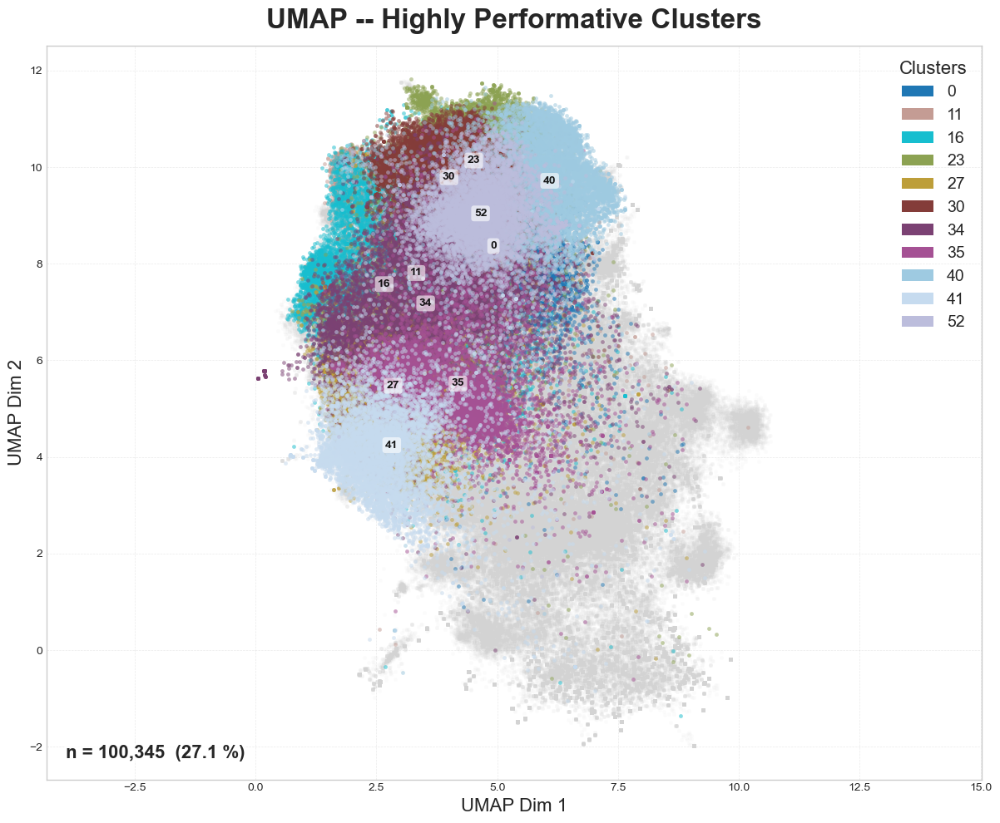

In [12]:
plot_selected_clusters(non_peripheral_umap,
                       alpha_fg= 0.5,
                       alpha_bg= 0.08,
                       annotate=True, 
                       figsize=(12, 10), 
                       highlight_ids= clear_performative, 
                       title='UMAP -- Highly Performative Clusters', 
                       legend_title='Clusters',
                       save_as= "UMAP_Performative",
                       fixed_palette=True)

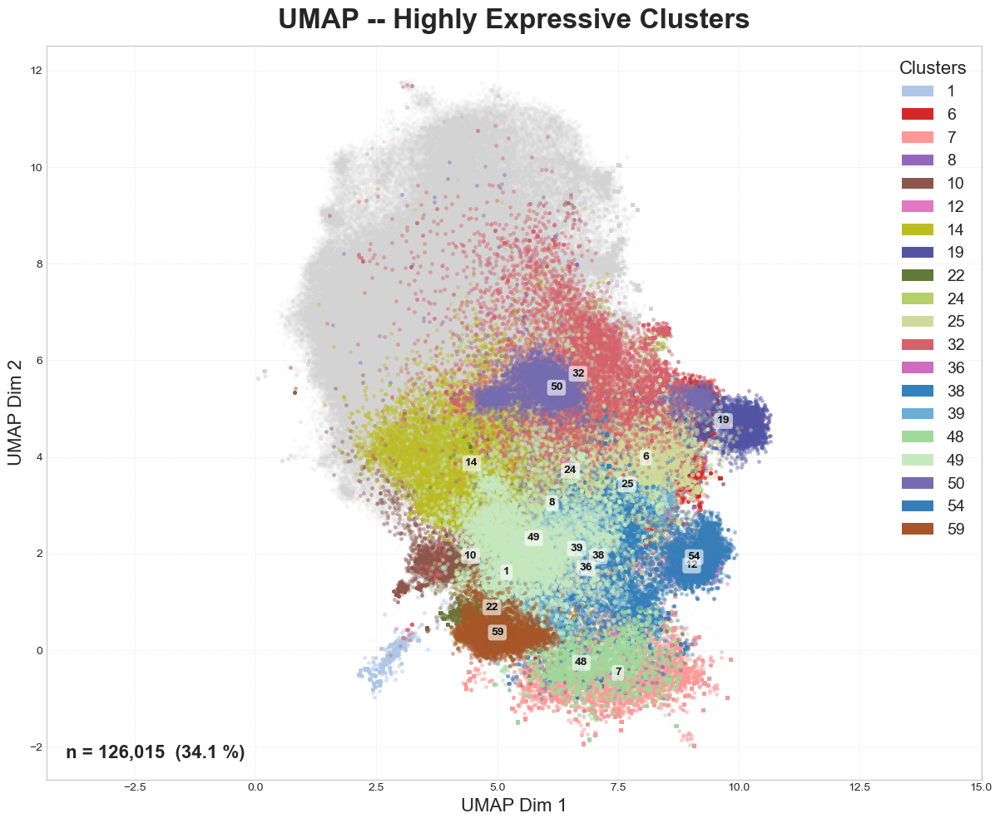

In [13]:
plot_selected_clusters(non_peripheral_umap, 
                       annotate=True,   
                       alpha_fg= 0.45,
                       alpha_bg= 0.08,
                       figsize=(12, 10), 
                       highlight_ids= clear_expressive, 
                       title='UMAP -- Highly Expressive Clusters', 
                       legend_title='Clusters',
                       save_as= "UMAP_Expressive",
                       fixed_palette=True)

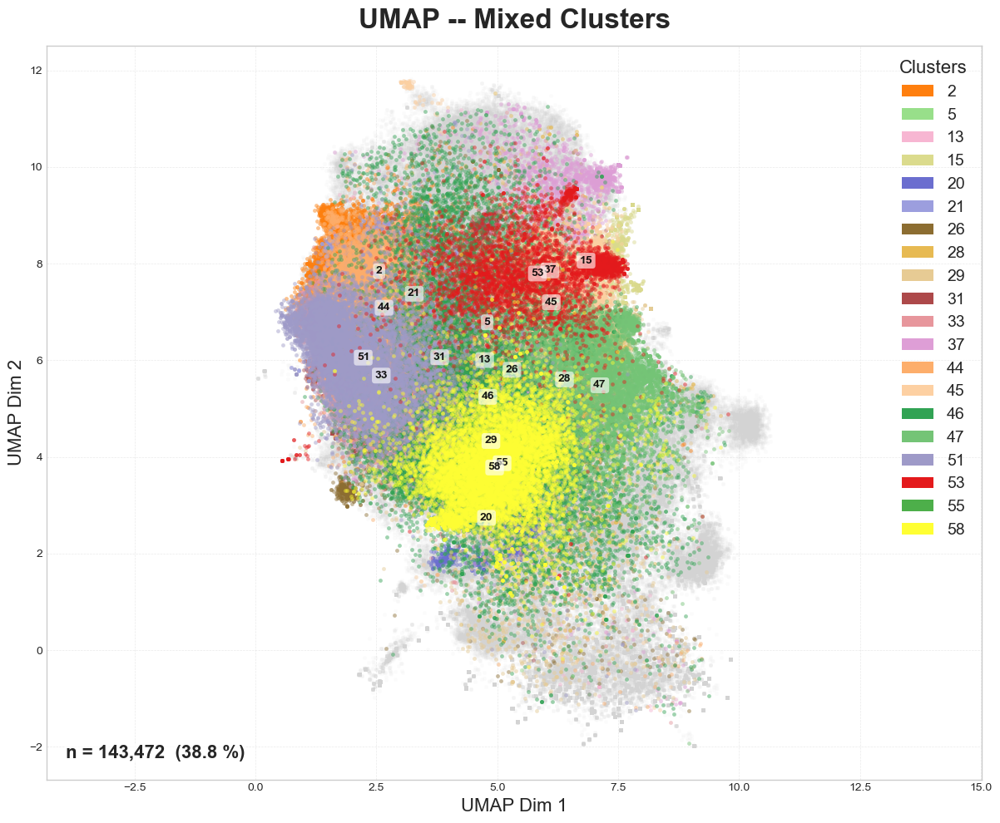

In [14]:
mixed_clusters = list(range(60))
for cluster in clear_performative + clear_expressive + peripheral_clusters:
    if cluster in mixed_clusters:
        mixed_clusters.remove(cluster)
plot_selected_clusters(non_peripheral_umap, 
                       annotate=True,   
                       alpha_fg= 0.45,
                       alpha_bg= 0.08,
                       figsize=(12, 10), 
                       highlight_ids= mixed_clusters, 
                       title='UMAP -- Mixed Clusters', 
                       legend_title='Clusters',
                       save_as= "UMAP_Mixed",
                       fixed_palette=True)

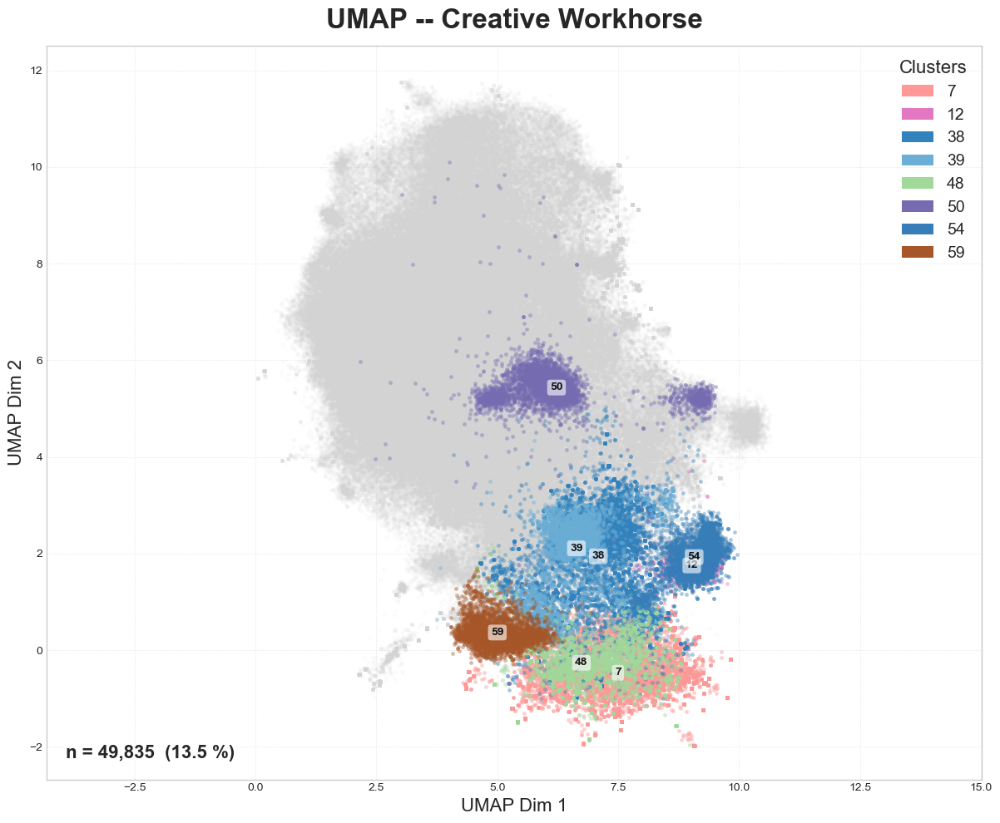

In [15]:
plot_selected_clusters(non_peripheral_umap, 
                       annotate=True, 
                       alpha_fg= 0.4,
                       figsize=(12, 10), 
                       highlight_ids= scaled_creative_workhorse_clusters, 
                       title='UMAP -- Creative Workhorse', 
                       legend_title='Clusters',
                       save_as= "UMAP_Creative_workhorse",
                       fixed_palette=True)

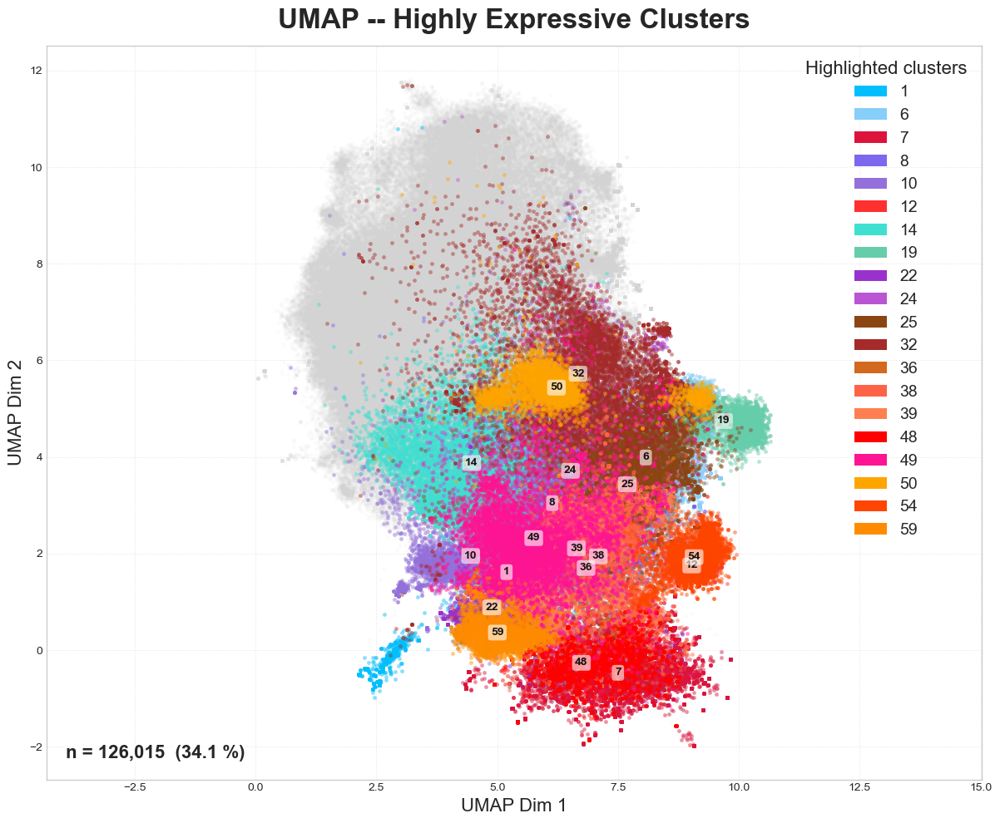

In [16]:
# Define scaled_creative_workhorse_clusters with a gradient color scheme from orange to red
scaled_creative_workhorse_clusters = [7, 48, 12, 54, 38, 39, 59, 50]
# Create a color gradient from orange to red for these clusters
creative_workhorse_colors = {}
red_to_orange = ['#DC143C', '#FF0000', '#FF3030', '#FF4500', '#FF6347', '#FF7F50', '#FF8C00', '#FFA500']
for i, cluster_id in enumerate(scaled_creative_workhorse_clusters):
    creative_workhorse_colors[cluster_id] = red_to_orange[i]

# For clusters in clear_expressive but not in creative workhorse, use blues/greens/purples
expressive_not_workhorse = [c for c in clear_expressive if c not in scaled_creative_workhorse_clusters]
blues_greens_purples = ['#00BFFF', '#87CEFA', '#7B68EE', '#9370DB', '#40E0D0', '#66CDAA', '#9932CC', '#BA55D3', 
                        '#8B4513', '#A52A2A', '#D2691E', '#FF1493', '#C71585', '#4B0082', '#006400', '#2E8B57',
                        '#FF69B4', '#8A2BE2', '#DAA520', '#800000', '#4682B4', '#008080']
for i, cluster_id in enumerate(expressive_not_workhorse):
    creative_workhorse_colors[cluster_id] = blues_greens_purples[i % len(blues_greens_purples)]

plot_clusters_with_custom_colors(non_peripheral_umap, 
                                alpha_fg=0.45,
                                highlight_ids=clear_expressive, 
                                color_scheme=creative_workhorse_colors,
                                title='UMAP -- Highly Expressive Clusters')


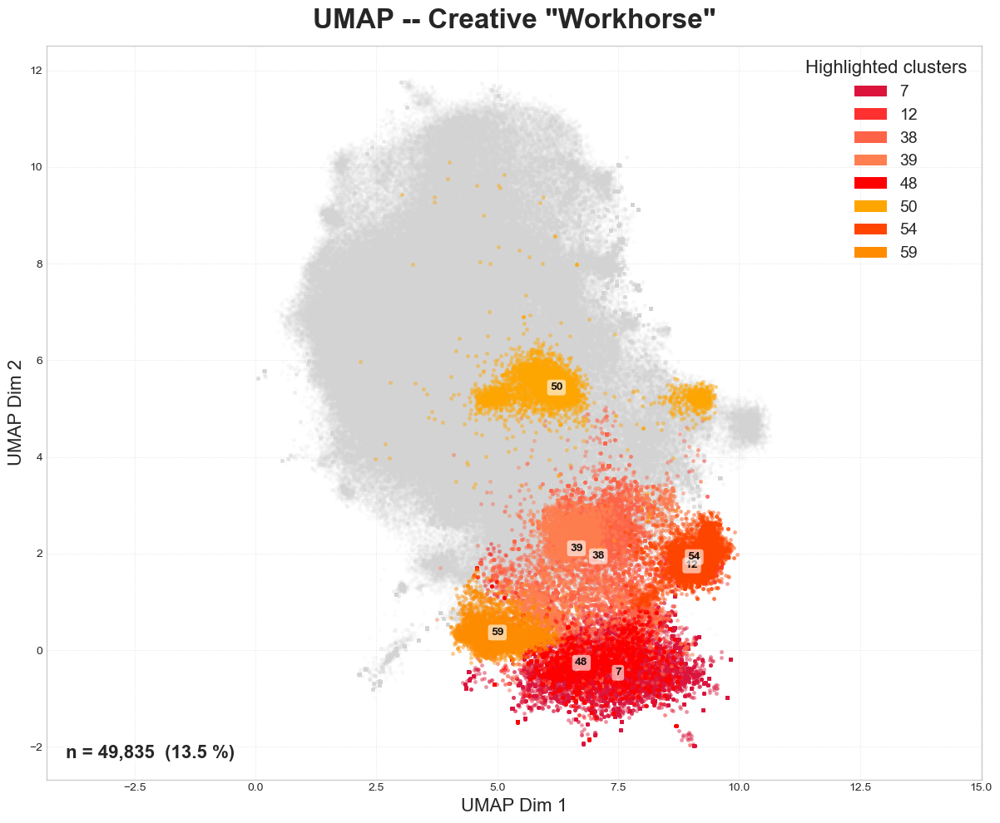

In [17]:
# Define scaled_creative_workhorse_clusters with a gradient color scheme from orange to red
scaled_creative_workhorse_clusters = [7, 48, 12, 54, 38, 39, 59, 50]
# Create a color gradient from orange to red for these clusters
creative_workhorse_colors = {}
red_to_orange = ['#DC143C', '#FF0000', '#FF3030', '#FF4500', '#FF6347', '#FF7F50', '#FF8C00', '#FFA500']
for i, cluster_id in enumerate(scaled_creative_workhorse_clusters):
    creative_workhorse_colors[cluster_id] = red_to_orange[i]

plot_clusters_with_custom_colors(non_peripheral_umap, 
                            alpha_fg=0.45,
                            highlight_ids=scaled_creative_workhorse_clusters, 
                            color_scheme=creative_workhorse_colors,
                            title='UMAP -- Creative "Workhorse"')

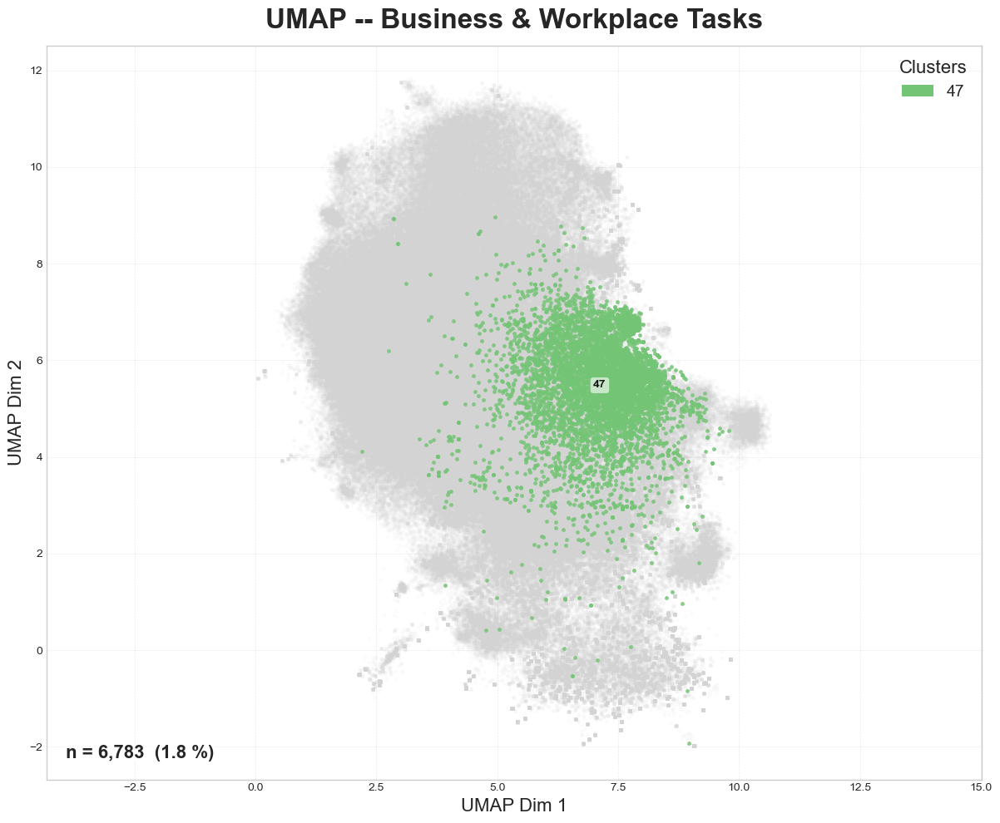

In [28]:
plot_selected_clusters(non_peripheral_umap, 
                       annotate=True, 
                       figsize=(12, 10), 
                       highlight_ids= [47],
                       title='UMAP -- Business & Workplace Tasks',
                       legend_title='Clusters',
                       fixed_palette=True)

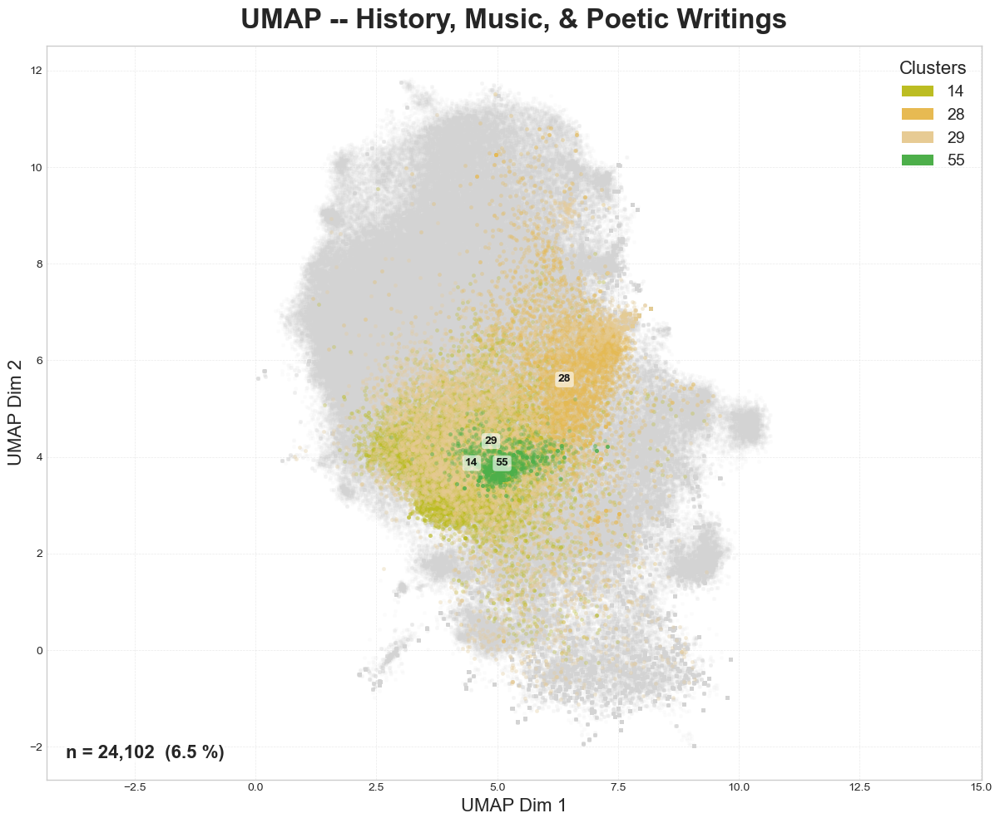

In [19]:
plot_selected_clusters(non_peripheral_umap, 
                       annotate=True, 
                       figsize=(12, 10), 
                       alpha_fg= 0.3,
                       highlight_ids= [14, 55] + music_poetry_clusters, 
                       title='UMAP -- History, Music, & Poetic Writings', 
                       legend_title='Clusters',
                       save_as= "UMAP_History_Music",
                       fixed_palette=True)

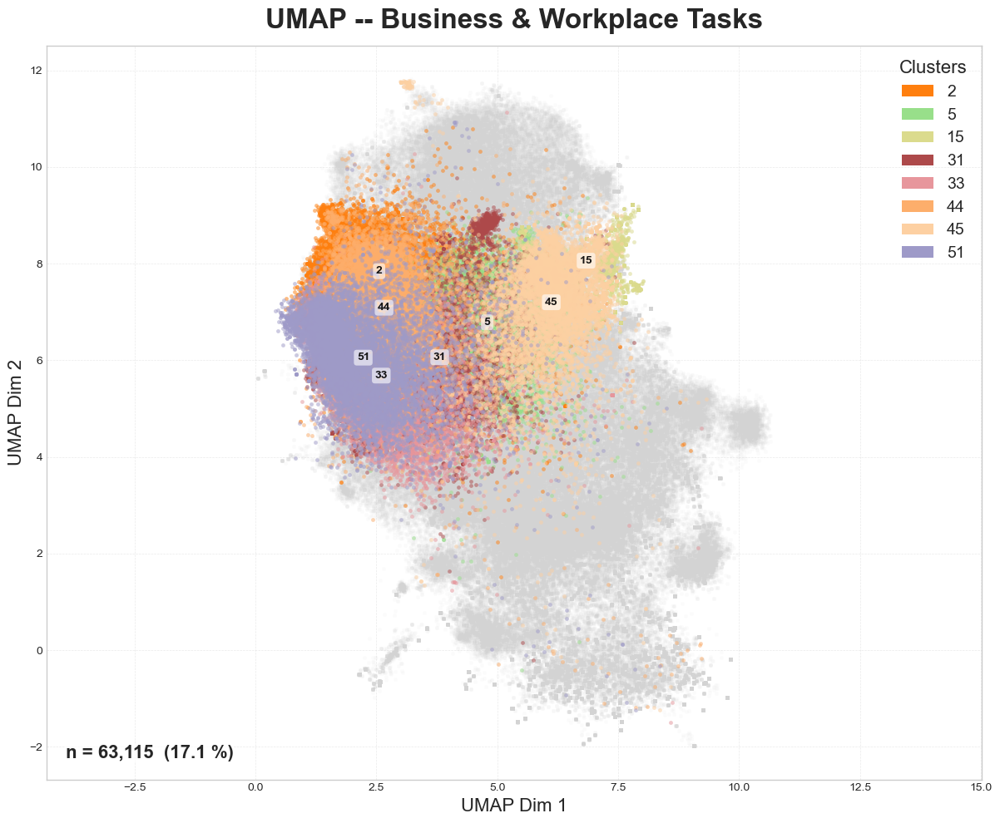

In [20]:
plot_selected_clusters(non_peripheral_umap, 
                       annotate=True, 
                       figsize=(12, 10), 
                       alpha_fg= 0.5,
                       highlight_ids= business_workplace_clusters, 
                       title='UMAP -- Business & Workplace Tasks', 
                       legend_title='Clusters',
                       save_as= "UMAP_Business_Workplace",
                       fixed_palette=True)

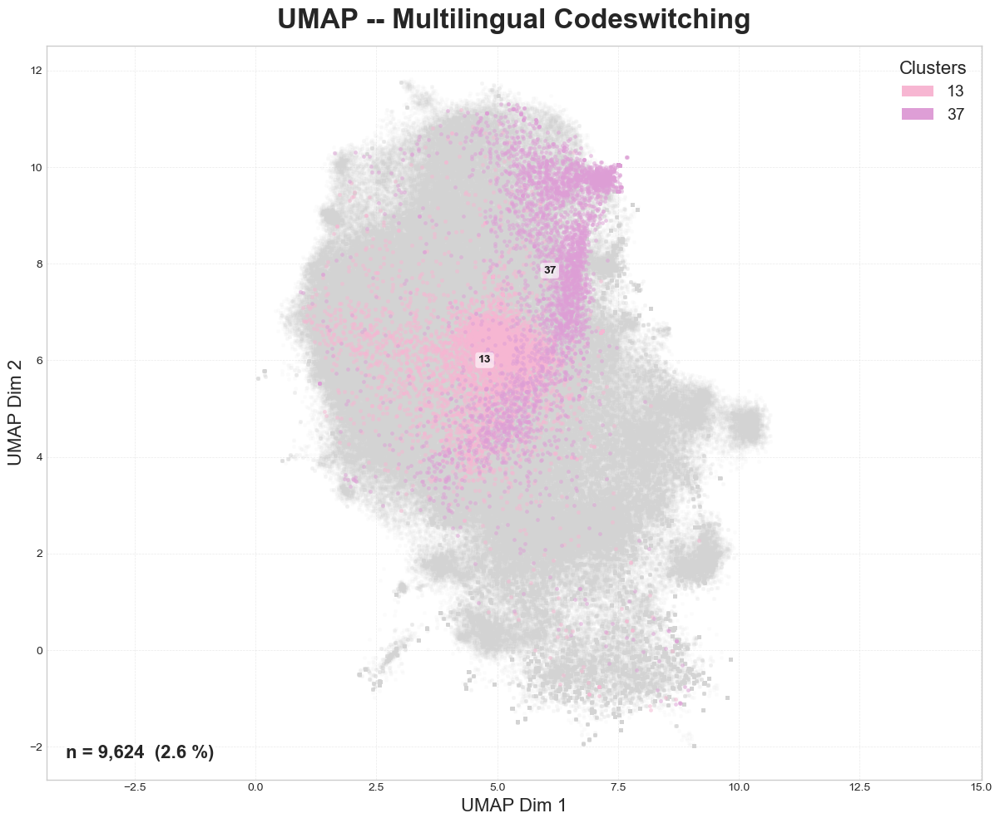

In [21]:
plot_selected_clusters(non_peripheral_umap, 
                       annotate=True, 
                       figsize=(12, 10), 
                       alpha_fg= 0.5,
                       highlight_ids= codeswitching_clusters, 
                       title='UMAP -- Multilingual Codeswitching', 
                       legend_title='Clusters',
                       save_as= "UMAP_Codeswitching",
                       fixed_palette=True)

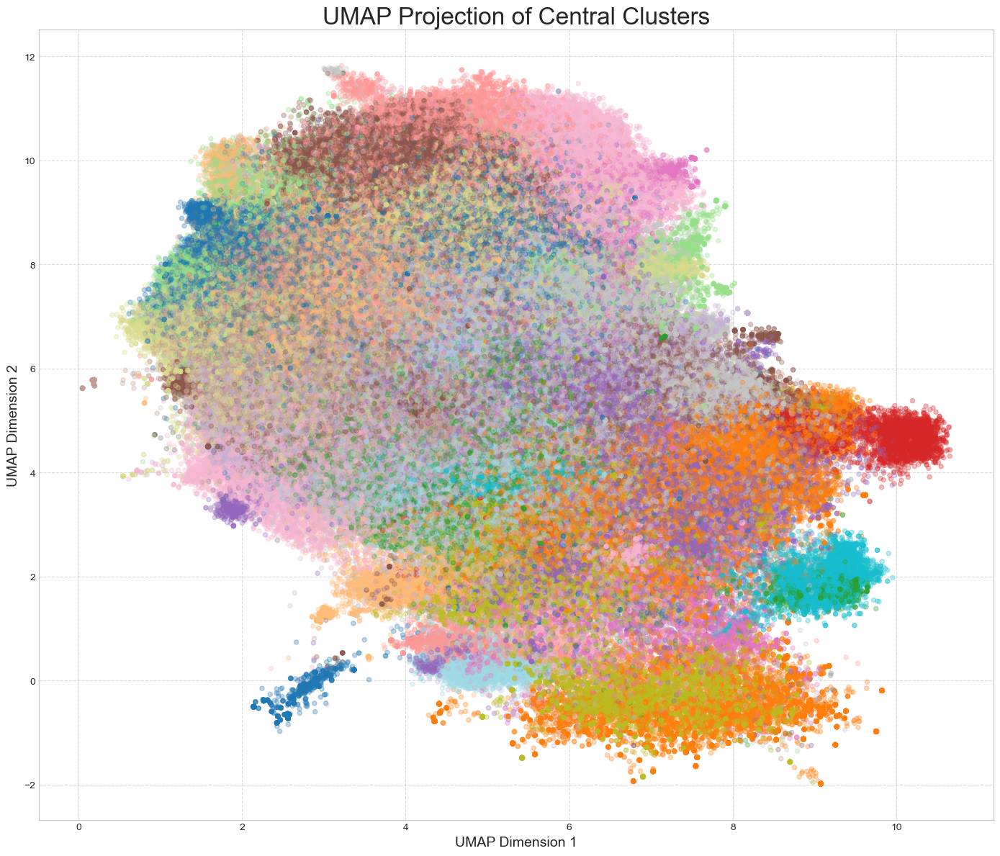

In [22]:
# Set the style
plt.style.use('seaborn-v0_8-whitegrid')

# Create a visualization colored by the existing cluster column
plt.figure(figsize=(14, 12))
scatter = plt.scatter(
    non_peripheral_umap['umap_x'],
    non_peripheral_umap['umap_y'],
    c=non_peripheral_umap['cluster'], #.astype('category').cat.codes,  # Convert to numeric codes
    cmap='tab20',  # Colormap with distinct colors
    alpha=0.3,
    s=20
)

plt.title('UMAP Projection of Central Clusters', fontsize=24)
plt.xlabel('UMAP Dimension 1', fontsize=14)
plt.ylabel('UMAP Dimension 2', fontsize=14)

# Add grid for better readability
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
# plt.savefig('cluster_umap_sample.png', dpi=300, bbox_inches='tight')
plt.show()

In [23]:
from typing import List, Optional
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import Patch


def plot_publication_clusters(
    df,
    clear_performative,
    clear_expressive,
    pure_technical_coding_clusters,
    scaled_creative_workhorse_clusters,
    cluster_col='cluster',
    figsize=(12, 10),
    pt_size=12,
    alpha_bg=0.1,
    alpha_fg=0.25,
    save_as=None,
    title='UMAP Projection – Publication Quality',
):
    """
    Plots clusters for publication with four custom color groups and legend.
    Colors:
      - clear_performative: light blue (#87cefa)
      - clear_expressive: light salmon (#ffa07a)
      - pure_technical_coding_clusters: dark blue (#1e3a5c)
      - scaled_creative_workhorse_clusters: dark orange (#d2691e)
    If a cluster is in both a clear and a dark group, the dark color takes precedence.
    Legend only shows these four, no count text, and title is customizable.
    """
    # Color and label mapping
    color_map = {}
    label_map = {}
    # Dark colors take precedence
    for cid in pure_technical_coding_clusters:
        color_map[cid] = '#1e3a5c'
        label_map[cid] = 'Coding & Technical'
    for cid in scaled_creative_workhorse_clusters:
        color_map[cid] = '#d2691e'
        label_map[cid] = 'Narrative "Mills"'
    for cid in clear_performative:
        if cid not in color_map:
            color_map[cid] = '#87cefa'
            label_map[cid] = 'Performative'
    for cid in clear_expressive:
        if cid not in color_map:
            color_map[cid] = '#ffa07a'
            label_map[cid] = 'Expressive'

    # For plotting, get all clusters in any group
    all_clusters = set(clear_performative) | set(clear_expressive) | set(pure_technical_coding_clusters) | set(scaled_creative_workhorse_clusters)
    highlight_ids = sorted(all_clusters)

    fig, ax = plt.subplots(figsize=figsize)

    # Background: all points in lightgrey
    ax.scatter(df['umap_x'], df['umap_y'],
               color='lightgrey', s=pt_size,
               alpha=alpha_bg, linewidths=0)

    # Plot each group, but only one legend entry per group
    legend_labels = {
        'Performative': {'color': '#87cefa', 'shown': False},
        'Expressive': {'color': '#ffa07a', 'shown': False},
        'Coding & Technical': {'color': '#1e3a5c', 'shown': False},
        'Narrative "Mills"': {'color': '#d2691e', 'shown': False},
    }

    for cid in highlight_ids:
        mask = df[cluster_col] == cid
        color = color_map[cid]
        label = label_map[cid]
        show_label = not legend_labels[label]['shown']
        ax.scatter(df.loc[mask, 'umap_x'],
                   df.loc[mask, 'umap_y'],
                   color=color, s=pt_size,
                   alpha=alpha_fg, label=label if show_label else None,
                   linewidths=0)
        legend_labels[label]['shown'] = True

    # Build custom legend handles (one per group)
    handles = [Patch(facecolor=info['color'], label=label) for label, info in legend_labels.items()]
    ax.legend(handles=handles, framealpha=0.9, fontsize=14, title_fontsize=16, loc='upper right')

    # Axis & title styling
    ax.set_xlabel('UMAP Dim 1', fontsize=16)
    ax.set_ylabel('UMAP Dim 2', fontsize=16)
    ax.set_title(title, fontsize=24, pad=15, fontweight='bold')
    ax.set_aspect('equal', adjustable='datalim')
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.4)

    plt.tight_layout()
    if save_as:
        fig.savefig(save_as, dpi=300, bbox_inches='tight')
    plt.show() 

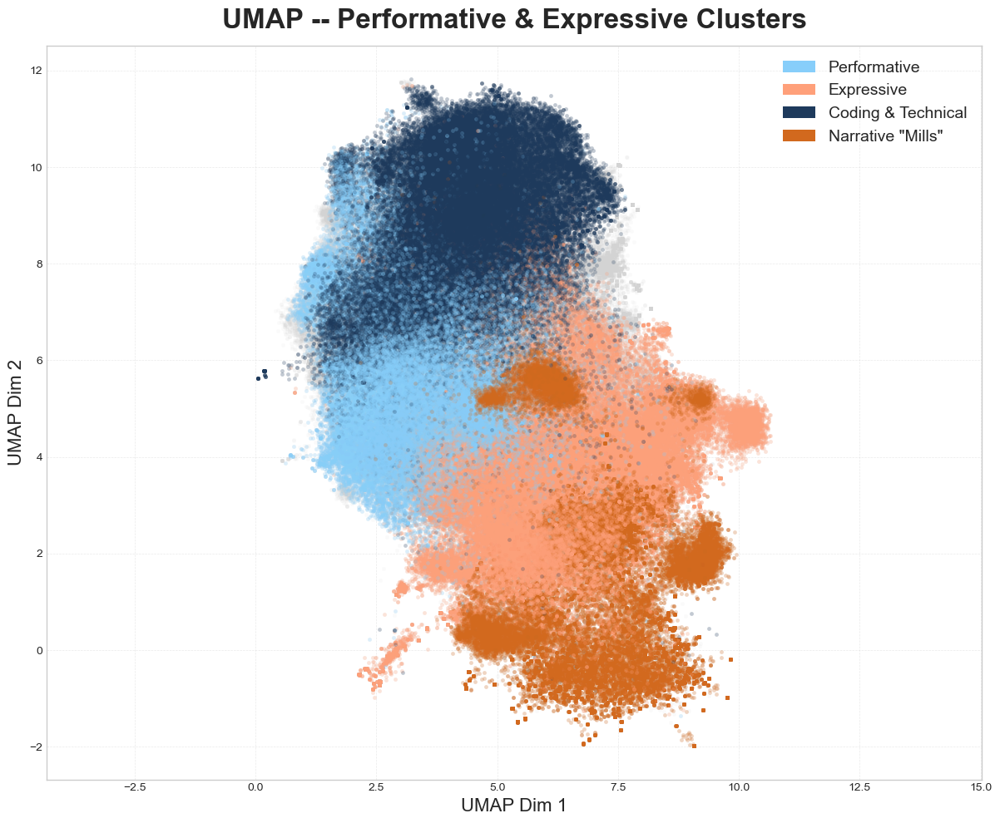

In [24]:
plot_publication_clusters(
    non_peripheral_umap,
    clear_performative=clear_performative,
    clear_expressive=clear_expressive,
    pure_technical_coding_clusters=pure_technical_coding_clusters,
    scaled_creative_workhorse_clusters=scaled_creative_workhorse_clusters,
    title="UMAP -- Performative & Expressive Clusters"
)

In [31]:
non_peripheral_umap.head()

,conversation_hash,hashed_ip,timestamp,first_user_query,device_type,cluster,typid_label,typid_score,politeguard_label,politeguard_score,formality_label,formality_score,umap_x,umap_y,umap_z
0,c9ec5b440fbdd2a269333dd241f32f64,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:02:53+00:00,Hey there! Are you familiar with reality shift...,windows,10,polite,0.932727,polite,0.986204,formal,0.998626,4.173508,2.940342,8.221884
1,cf1267ca6b2f6fccc9c36652a00059a1,8133108d1c433c180c6be8302dc5a6681f2bec980190a1...,2023-04-09 00:04:52+00:00,"Old age PT hx of DM, HTN, dyslipidemia His ECG...",windows,41,polite,0.888530,neutral,0.623107,informal,0.900437,1.675434,3.941467,6.159513
2,e98d3e74c57f9a65261df393d9124ac2,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:06:49+00:00,Hey there! Are you familiar with reality shift...,windows,10,polite,0.936191,polite,0.987203,formal,0.998625,4.268442,1.860670,8.529078
3,2e8fd255aab694b07a0be8d83cb53a7b,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:08:41+00:00,Hey there! Are you familiar with reality shift...,windows,49,polite,0.929415,polite,0.987390,formal,0.998623,4.606233,2.457284,8.382767
4,59c72510f3143025f94f75b883b026bd,dbf18c49cf217bc344a40b187ed35c3219f994b1d3b2d0...,2023-04-09 00:10:00+00:00,i wanna you to write me terms & conditions and...,windows,2,polite,0.922587,polite,0.955610,informal,0.997220,4.197243,8.306612,8.982198
